# Objective:
## Analyze the data available on the IMDb website for movies released in the cinema between 1894 and 2017.

In [3]:
#Importing Libraries
import pandas as pd
import matplotlib.pyplot as plt
import plotly.express as px
from scipy.stats import pearsonr
import plotly.graph_objects as go
import seaborn as sns

### Loading Dataset

In [4]:
movies_df = pd.read_csv("IMDb movies.csv",low_memory=False)
ratings_df = pd.read_csv("IMDb ratings.csv",low_memory=False)

low_memory is set to False due to an warning as below
c:\users\lekshmi\appdata\local\programs\python\python39\lib\site-packages\IPython\core\interactiveshell.py:3169: DtypeWarning: Columns (3) have mixed types.Specify dtype option on import or set low_memory=False.
  has_raised = await self.run_ast_nodes(code_ast.body, cell_name,

In [5]:
# List of columns in the dataset
movies_df.columns

Index(['imdb_title_id', 'title', 'original_title', 'year', 'date_published',
       'genre', 'duration', 'country', 'language', 'director', 'writer',
       'production_company', 'actors', 'description', 'avg_vote', 'votes',
       'budget', 'usa_gross_income', 'worlwide_gross_income', 'metascore',
       'reviews_from_users', 'reviews_from_critics'],
      dtype='object')

In [6]:
ratings_df.columns

Index(['imdb_title_id', 'weighted_average_vote', 'total_votes', 'mean_vote',
       'median_vote', 'votes_10', 'votes_9', 'votes_8', 'votes_7', 'votes_6',
       'votes_5', 'votes_4', 'votes_3', 'votes_2', 'votes_1',
       'allgenders_0age_avg_vote', 'allgenders_0age_votes',
       'allgenders_18age_avg_vote', 'allgenders_18age_votes',
       'allgenders_30age_avg_vote', 'allgenders_30age_votes',
       'allgenders_45age_avg_vote', 'allgenders_45age_votes',
       'males_allages_avg_vote', 'males_allages_votes', 'males_0age_avg_vote',
       'males_0age_votes', 'males_18age_avg_vote', 'males_18age_votes',
       'males_30age_avg_vote', 'males_30age_votes', 'males_45age_avg_vote',
       'males_45age_votes', 'females_allages_avg_vote',
       'females_allages_votes', 'females_0age_avg_vote', 'females_0age_votes',
       'females_18age_avg_vote', 'females_18age_votes',
       'females_30age_avg_vote', 'females_30age_votes',
       'females_45age_avg_vote', 'females_45age_votes',
       

In [7]:
movies_df.shape

(85855, 22)

In [8]:
ratings_df.shape

(85855, 49)

In [9]:
movies_df.head()

,imdb_title_id,title,original_title,year,date_published,genre,duration,country,language,director,...,actors,description,avg_vote,votes,budget,usa_gross_income,worlwide_gross_income,metascore,reviews_from_users,reviews_from_critics
0,tt0000009,Miss Jerry,Miss Jerry,1894,1894-10-09,Romance,45,USA,None,Alexander Black,...,"Blanche Bayliss, William Courtenay, Chauncey D...",The adventures of a female reporter in the 1890s.,5.9,154,NaN,NaN,NaN,NaN,1.0,2.0
1,tt0000574,The Story of the Kelly Gang,The Story of the Kelly Gang,1906,1906-12-26,"Biography, Crime, Drama",70,Australia,None,Charles Tait,...,"Elizabeth Tait, John Tait, Norman Campbell, Be...",True story of notorious Australian outlaw Ned ...,6.1,589,$ 2250,NaN,NaN,NaN,7.0,7.0
2,tt0001892,Den sorte drøm,Den sorte drøm,1911,1911-08-19,Drama,53,"Germany, Denmark",NaN,Urban Gad,...,"Asta Nielsen, Valdemar Psilander, Gunnar Helse...",Two men of high rank are both wooing the beaut...,5.8,188,NaN,NaN,NaN,NaN,5.0,2.0
3,tt0002101,Cleopatra,Cleopatra,1912,1912-11-13,"Drama, History",100,USA,English,Charles L. Gaskill,...,"Helen Gardner, Pearl Sindelar, Miss Fielding, ...",The fabled queen of Egypt's affair with Roman ...,5.2,446,$ 45000,NaN,NaN,NaN,25.0,3.0
4,tt0002130,L'Inferno,L'Inferno,1911,1911-03-06,"Adventure, Drama, Fantasy",68,Italy,Italian,"Francesco Bertolini, Adolfo Padovan",...,"Salvatore Papa, Arturo Pirovano, Giuseppe de L...",Loosely adapted from Dante's Divine Comedy and...,7.0,2237,NaN,NaN,NaN,NaN,31.0,14.0


In [10]:
movies_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 85855 entries, 0 to 85854
Data columns (total 22 columns):
 #   Column                 Non-Null Count  Dtype  
---  ------                 --------------  -----  
 0   imdb_title_id          85855 non-null  object 
 1   title                  85855 non-null  object 
 2   original_title         85855 non-null  object 
 3   year                   85855 non-null  object 
 4   date_published         85855 non-null  object 
 5   genre                  85855 non-null  object 
 6   duration               85855 non-null  int64  
 7   country                85791 non-null  object 
 8   language               85022 non-null  object 
 9   director               85768 non-null  object 
 10  writer                 84283 non-null  object 
 11  production_company     81400 non-null  object 
 12  actors                 85786 non-null  object 
 13  description            83740 non-null  object 
 14  avg_vote               85855 non-null  float64
 15  vo

In [11]:
movies_df.duplicated().sum()

0

In [12]:
movies_df.isnull().sum()/len(movies_df)

imdb_title_id            0.000000
title                    0.000000
original_title           0.000000
year                     0.000000
date_published           0.000000
genre                    0.000000
duration                 0.000000
country                  0.000745
language                 0.009702
director                 0.001013
writer                   0.018310
production_company       0.051890
actors                   0.000804
description              0.024635
avg_vote                 0.000000
votes                    0.000000
budget                   0.723837
usa_gross_income         0.821490
worlwide_gross_income    0.638740
metascore                0.845029
reviews_from_users       0.088486
reviews_from_critics     0.137406
dtype: float64

In [13]:
#Dropping columns with null values greater than 8%

drop_movies = movies_df.isnull().sum()/len(movies_df)<=0.08
movies = movies_df.loc[:,drop_movies]
movies
drop_ratings = ratings_df.isnull().sum()/len(ratings_df)<=0.08
ratings = ratings_df.loc[:,drop_ratings]
ratings

,imdb_title_id,weighted_average_vote,total_votes,mean_vote,median_vote,votes_10,votes_9,votes_8,votes_7,votes_6,...,females_30age_avg_vote,females_30age_votes,females_45age_avg_vote,females_45age_votes,top1000_voters_rating,top1000_voters_votes,us_voters_rating,us_voters_votes,non_us_voters_rating,non_us_voters_votes
0,tt0000009,5.9,154,5.9,6.0,12,4,10,43,28,...,5.7,13.0,4.5,4.0,5.7,34.0,6.4,51.0,6.0,70.0
1,tt0000574,6.1,589,6.3,6.0,57,18,58,137,139,...,6.2,23.0,6.6,14.0,6.4,66.0,6.0,96.0,6.2,331.0
2,tt0001892,5.8,188,6.0,6.0,6,6,17,44,52,...,5.8,4.0,6.8,7.0,5.4,32.0,6.2,31.0,5.9,123.0
3,tt0002101,5.2,446,5.3,5.0,15,8,16,62,98,...,5.5,14.0,6.1,21.0,4.9,57.0,5.5,207.0,4.7,105.0
4,tt0002130,7.0,2237,6.9,7.0,210,225,436,641,344,...,7.3,82.0,7.4,77.0,6.9,139.0,7.0,488.0,7.0,1166.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
85850,tt9908390,5.3,398,5.5,6.0,13,9,26,65,104,...,5.7,11.0,5.0,2.0,5.5,12.0,6.3,22.0,5.3,214.0
85851,tt9911196,7.7,724,7.9,8.0,65,139,288,170,42,...,8.0,47.0,7.3,30.0,7.0,6.0,6.8,13.0,7.7,388.0
85852,tt9911774,7.9,265,7.8,8.0,63,29,61,61,31,...,NaN,NaN,NaN,NaN,1.0,1.0,NaN,NaN,2.0,2.0
85853,tt9914286,6.4,194,9.4,10.0,176,0,2,2,1,...,NaN,NaN,7.0,1.0,4.0,3.0,1.7,5.0,5.8,5.0


In [14]:
# Combining movies and ratings datasets
df = movies.set_index('imdb_title_id').join(ratings.set_index('imdb_title_id'))
df

,title,original_title,year,date_published,genre,duration,country,language,director,writer,...,females_30age_avg_vote,females_30age_votes,females_45age_avg_vote,females_45age_votes,top1000_voters_rating,top1000_voters_votes,us_voters_rating,us_voters_votes,non_us_voters_rating,non_us_voters_votes
imdb_title_id,,,,,,,,,,,,,,,,,,,,,
tt0000009,Miss Jerry,Miss Jerry,1894,1894-10-09,Romance,45,USA,None,Alexander Black,Alexander Black,...,5.7,13.0,4.5,4.0,5.7,34.0,6.4,51.0,6.0,70.0
tt0000574,The Story of the Kelly Gang,The Story of the Kelly Gang,1906,1906-12-26,"Biography, Crime, Drama",70,Australia,None,Charles Tait,Charles Tait,...,6.2,23.0,6.6,14.0,6.4,66.0,6.0,96.0,6.2,331.0
tt0001892,Den sorte drøm,Den sorte drøm,1911,1911-08-19,Drama,53,"Germany, Denmark",NaN,Urban Gad,"Urban Gad, Gebhard Schätzler-Perasini",...,5.8,4.0,6.8,7.0,5.4,32.0,6.2,31.0,5.9,123.0
tt0002101,Cleopatra,Cleopatra,1912,1912-11-13,"Drama, History",100,USA,English,Charles L. Gaskill,Victorien Sardou,...,5.5,14.0,6.1,21.0,4.9,57.0,5.5,207.0,4.7,105.0
tt0002130,L'Inferno,L'Inferno,1911,1911-03-06,"Adventure, Drama, Fantasy",68,Italy,Italian,"Francesco Bertolini, Adolfo Padovan",Dante Alighieri,...,7.3,82.0,7.4,77.0,6.9,139.0,7.0,488.0,7.0,1166.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
tt9908390,Le lion,Le lion,2020,2020-01-29,Comedy,95,"France, Belgium",French,Ludovic Colbeau-Justin,"Alexandre Coquelle, Matthieu Le Naour",...,5.7,11.0,5.0,2.0,5.5,12.0,6.3,22.0,5.3,214.0
tt9911196,De Beentjes van Sint-Hildegard,De Beentjes van Sint-Hildegard,2020,2020-02-13,"Comedy, Drama",103,Netherlands,"German, Dutch",Johan Nijenhuis,"Radek Bajgar, Herman Finkers",...,8.0,47.0,7.3,30.0,7.0,6.0,6.8,13.0,7.7,388.0
tt9911774,Padmavyuhathile Abhimanyu,Padmavyuhathile Abhimanyu,2019,2019-03-08,Drama,130,India,Malayalam,Vineesh Aaradya,"Vineesh Aaradya, Vineesh Aaradya",...,NaN,NaN,NaN,NaN,1.0,1.0,NaN,NaN,2.0,2.0


In [15]:
df.columns

Index(['title', 'original_title', 'year', 'date_published', 'genre',
       'duration', 'country', 'language', 'director', 'writer',
       'production_company', 'actors', 'description', 'avg_vote', 'votes',
       'weighted_average_vote', 'total_votes', 'mean_vote', 'median_vote',
       'votes_10', 'votes_9', 'votes_8', 'votes_7', 'votes_6', 'votes_5',
       'votes_4', 'votes_3', 'votes_2', 'votes_1', 'allgenders_18age_avg_vote',
       'allgenders_18age_votes', 'allgenders_30age_avg_vote',
       'allgenders_30age_votes', 'allgenders_45age_avg_vote',
       'allgenders_45age_votes', 'males_allages_avg_vote',
       'males_allages_votes', 'males_18age_avg_vote', 'males_18age_votes',
       'males_30age_avg_vote', 'males_30age_votes', 'males_45age_avg_vote',
       'males_45age_votes', 'females_allages_avg_vote',
       'females_allages_votes', 'females_18age_avg_vote',
       'females_18age_votes', 'females_30age_avg_vote', 'females_30age_votes',
       'females_45age_avg_vote', 'fe

In [16]:
movies_df['year']=movies_df['year'].replace('[TV Movie  ]','', regex=True).astype(int)
movies_df['year']

0        1894
1        1906
2        1911
3        1912
4        1911
         ... 
85850    2020
85851    2020
85852    2019
85853    2019
85854    2019
Name: year, Length: 85855, dtype: int32

In [17]:
movies_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 85855 entries, 0 to 85854
Data columns (total 22 columns):
 #   Column                 Non-Null Count  Dtype  
---  ------                 --------------  -----  
 0   imdb_title_id          85855 non-null  object 
 1   title                  85855 non-null  object 
 2   original_title         85855 non-null  object 
 3   year                   85855 non-null  int32  
 4   date_published         85855 non-null  object 
 5   genre                  85855 non-null  object 
 6   duration               85855 non-null  int64  
 7   country                85791 non-null  object 
 8   language               85022 non-null  object 
 9   director               85768 non-null  object 
 10  writer                 84283 non-null  object 
 11  production_company     81400 non-null  object 
 12  actors                 85786 non-null  object 
 13  description            83740 non-null  object 
 14  avg_vote               85855 non-null  float64
 15  vo

print(df.duplicated().sum())

We started the exploratory analysis by first visualizing the top 30 movie making countries.For this only one dataset is used movies_df.

### Top 30 movie making countries

In [18]:
movies_grpby_cntry = movies_df.groupby(["country"]).agg(Count=('title','count'))
xyz = movies_grpby_cntry.sort_values(by='Count',ascending=False)
movies_madeby_country=xyz.head(30)

In [19]:
px.bar(data_frame=movies_madeby_country,y='Count',title='Top 30 movie making countries',text='Count')

USA made most movies followed by India, UK and Japan .Egypt made the least number of movies as per the data provided.

After analysing the movies_df we found 2 columns average vote and weighted average vote.To see whether there is any relation between these 2 we ploted a scatter plot and below is the result.

#### Average Vote VS Weighted Average Vote

In [20]:
fig = px.scatter(df, x="weighted_average_vote", y="mean_vote", trendline="ols")
fig.update_layout(title={'text': f"Weighted Average Vote vs Mean Vote, Corr: {round(pearsonr(df['weighted_average_vote'], df['mean_vote'])[0], 3)} ", 'x': 0.5,})
fig.show()

From the scatter plot, there are lots of movies with high average votes but very less weighted average vote .

The reason behind this is as per IMDB website not all votes have the same impact (or ‘weight’) on the final rating. When unusual voting activity is detected, an alternate weighting calculation may be applied in order to preserve the reliability of the system.

So Weighted Average vote will be taken in our further analysis.

### Total Number of Movies per year

In [21]:
fig = px.line(df.groupby('year').size().drop("TV Movie 2019"))
fig.update_layout(title={'text': f"Total Number of Movies Per Year", 'x': 0.5},showlegend=False)
fig.show()

After 2017 there is a shocking decline in the number of movies.One reason may be the filming industry is in a serious crisis! They are not producing films because of COVID-19.Another reason may be people didn’t have time to watch the most recent movies. If they didn’t watch them, they don’t rate them, and there will be a decline in ratings.

Now we are going to explore till 2017 what have people watched most? For this extracting the different genres and making a dataframe with columns as name of genres, count of movies in that genres, full rating and avg rating for that particular genres.

In [ ]:
df_genres = df.copy()

genres=pd.DataFrame(index=[], columns=["name","count", "full_rating", "avg_rating"])

for index,movie in df_genres.iterrows():
    for genre in movie["genre"].split(", "):
        if(len(genres[genres["name"] == genre]) < 1):
            genres.loc[len(genres.index)] = [genre, 0,0,0]
        genres.loc[genres["name"] == genre, "count"] += 1
        genres.loc[genres["name"] == genre, "full_rating"] += movie["avg_vote"]

In [23]:
for index,genre in genres.iterrows():
    if(genre["count"] != 0):
        genre["avg_rating"] = genre["full_rating"] / genre["count"]

genres

,name,count,full_rating,avg_rating
0,Romance,2855,18482.1,6.47359
1,Biography,329,2170.2,6.596353
2,Crime,1884,12111.8,6.428769
3,Drama,6129,40220.6,6.562343
4,History,435,2829.1,6.503678
5,Adventure,1479,9146.2,6.184043
6,Fantasy,353,2280.8,6.46119
7,War,702,4605.1,6.559972
8,Mystery,807,5152.3,6.384511
9,Horror,508,2952.6,5.812205


In [24]:
top_genre = genres.sort_values(by='count',ascending=False)
top_genre

,name,count,full_rating,avg_rating
3,Drama,6129,40220.6,6.562343
11,Comedy,3466,22257.4,6.421639
0,Romance,2855,18482.1,6.47359
2,Crime,1884,12111.8,6.428769
5,Adventure,1479,9146.2,6.184043
13,Action,1044,6450.1,6.178257
18,Musical,817,5209.3,6.376132
8,Mystery,807,5152.3,6.384511
10,Western,708,4450.5,6.286017
7,War,702,4605.1,6.559972


In [25]:
import numpy
# top 6 genres by the total number of movies
top6_genre = top_genre.iloc[:,0:1].head(6)
top6_genre.columns=['Top6_genre']
top6_genre = top6_genre.set_index('Top6_genre').index.values
top6_genre

array(['Drama', 'Comedy', 'Romance', 'Crime', 'Adventure', 'Action'],
      dtype=object)

In [ ]:
df_genres_till2017 = df.copy()
#new df with columns["name","count", "full_rating", "avg_rating",'production_year']
newdf_genres_till2017=pd.DataFrame(index=[], columns=["name","count"])

for index,movie in df_genres_till2017.iterrows():
    if movie['year'] < '2017':
        for genre in movie["genre"].split(", "):
            #print(genre)
            #print(movie['year'])
            if(len(newdf_genres_till2017[newdf_genres_till2017["name"] == genre]) < 1):
                newdf_genres_till2017.loc[len(newdf_genres_till2017.index)]= [genre, 0]
                #print([newdf_genres_till2017["name"])
                #newdf_genres_till2017.loc[len(newdf_genres_till2017.index)] = [genre, 0]
            newdf_genres_till2017.loc[newdf_genres_till2017["name"] == genre, "count"] += 1
            #newdf_genres_till2017.loc[newdf_genres_till2017["name"] == genre, "production_year"] = movie['year']
            
            
newdf_genres_till2017


,name,count
0,Romance,12919
1,Biography,1993
2,Crime,10042
3,Drama,41700
4,History,2012
5,Adventure,6823
6,Fantasy,3385
7,War,2104
8,Mystery,4498
9,Horror,8085


In [ ]:
newdf_genres_till2017.sort_values(by='count',ascending=False).head(10)

,name,count
3,Drama,41700
11,Comedy,26184
0,Romance,12919
13,Action,11329
2,Crime,10042
15,Thriller,9569
9,Horror,8085
5,Adventure,6823
8,Mystery,4498
12,Family,3482


Above Analysis shows till 2017 people were interested in Drama,Comedy,Action,Romance and Crime movies. But Sci-Fi , historical  and adventurous movies are rated less which are actually trending nowadays.

In [ ]:
df_genres_till2017_grph = df.copy()
#new df with columns["name","count", "full_rating", "avg_rating",'production_year']
newdf_genres_till2017_grph=pd.DataFrame(index=[], columns=["name","production_year"])

for index,movie in df_genres_till2017_grph.iterrows():
    if movie['year'] < '2017':
        for genre in movie["genre"].split(", "):
            #print(genre)
            #print(movie['year'])
            #if(len(newdf_genres_till2017[newdf_genres_till2017["name"] == genre]) < 1):
            newdf_genres_till2017_grph.loc[len(newdf_genres_till2017_grph.index)]= [genre, 0]
                #print([newdf_genres_till2017["name"])
                #newdf_genres_till2017.loc[len(newdf_genres_till2017.index)] = [genre, 0]
            #newdf_genres_till2017.loc[newdf_genres_till2017["name"] == genre, "count"] += 1
            newdf_genres_till2017_grph.loc[newdf_genres_till2017_grph["name"] == genre, "production_year"] = movie['year']
            
            
newdf_genres_till2017_grph


### Is there any relation between duration and ratings??

We were curious to know whether there is any relationship between the duration of movies and votes given by the viewers.By utilizing the average vote and the duration of each movies we plotted a scatter plot.Here we used weighted average vote instead of averge vote due to the reasons already mentioned before.

In [26]:
# Duration Vs ratings
fig = px.scatter(df, x="duration", y="weighted_average_vote")
fig.update_layout(title={'text': f"Duration vs Average Rating", 'x': 0.5})
fig.show()

Unfortunately we could not find any relation between the duration of movies and ratings given by viewers

### Votes by Language with more than 500 entries

In [27]:
include = df.groupby('language').size().sort_values(ascending=False) >= 500
lang_df = df.groupby('language').mean().loc[include].sort_values("weighted_average_vote", ascending=False)
fig = px.bar(lang_df, y="weighted_average_vote")
fig.update_layout(title={'text': f"Average Weighted Rating for Each Language (More than 500 Entries)"})
fig.show()

Interestingly Japanese and Tamil movies are most rated and English is the least rated

### Comaprison of US vs Non-US voters Rating

In [28]:
fig = go.Figure()
fig.add_trace(go.Bar(x=lang_df.index, y=lang_df["us_voters_rating"], name="US Voters Rating"))
fig.add_trace(go.Bar(x=lang_df.index, y=lang_df["non_us_voters_rating"], name="Non-US Voters Rating"))
fig.update_layout(title={'text': f"Comparison of US vs Non-US Voters Rating", 'x': 0.5,
                             'xanchor': 'center', 'font': {'size': 20}})
fig.show()

 Except for Dutch and English all other languages are been rated almost equally by the US and non-US voters.
 For Dutch non-US voters are more but for English its the reverse.

### Top 10 Actors with respect to numbers of movies acted

In [29]:
tmp_act_df = df.copy() 
tmp_act_df['actors'] = df['actors'].fillna("None")
tmp_act_df['actors'] = tmp_act_df['actors'].str.split(', ')

In [30]:
flat = [[x, df.loc[i, "weighted_average_vote"]] for i, y in tmp_act_df['actors'].iteritems() for x in y]
rating_df = pd.DataFrame(flat, columns=["Actor", "Rating"])
rating_df

,Actor,Rating
0,Blanche Bayliss,5.9
1,William Courtenay,5.9
2,Chauncey Depew,5.9
3,Elizabeth Tait,6.1
4,John Tait,6.1
...,...,...
1155357,Arés Fuster,6.7
1155358,Judit Martín,6.7
1155359,Martí Múrcia,6.7
1155360,Mariona Pagès,6.7


In [ ]:
actor_df = pd.DataFrame(rating_df.groupby('Actor').size(), columns=["Movies"])
actor_df['Rating'] = rating_df.groupby('Actor').mean()
actor_df.sort_values(by='Movies',ascending=False)

,Movies,Rating
Actor,,
Brahmanandam,318,5.951258
Anupam Kher,211,5.664929
Nassar,204,6.288725
Eric Roberts,204,4.431373
Prakash Raj,189,6.189947
...,...,...
James Bynum,1,5.500000
James Byndon,1,6.500000
James Butterfield,1,7.700000


In [ ]:
fig = px.bar(actor_df.sort_values("Movies", ascending=False).iloc[:10], y="Movies", hover_data=["Rating"])
fig.update_layout(title={'text': f"Top 10 Actors with the Most Movies", 'x': 0.5})
fig.show()

From the analysis 'Brahmanandam' is the actor with most number of movies, 318 movies he has acted.Followed by Anupam Kher and Nassar.So there is a chance for their movies to become popular than any other actors movie.

In [ ]:
num_movies = 10
actor_df_split = actor_df.loc[actor_df["Movies"] >= num_movies].sort_values("Rating", ascending=False)
fig = px.bar(actor_df_split.iloc[:10], y="Rating", hover_data=["Movies"])
fig.update_layout(title={'text': f"Top 10 Highest Rated Actors With More than {num_movies} Movies", 'x': 0.5})
fig.show()

We took 10 best movies of each actors.Our finding was different from that of the analysis we have done earlier.It is seen that Balkrishna's movies are having highest rating compared to others.He is the only actor who crossed rating of 8.16, Acted movies 11.Following 9 actors ratings are between 7.5 to 7.9.

### Movie Sets with all movies rated greater than 8.5 and having more than 500000 votes

In [ ]:
movie_highest=df[(df['weighted_average_vote']>8.5) & (df['votes'] > 500000)]
movie_highest.head()

,title,original_title,year,date_published,genre,duration,country,language,director,writer,...,females_30age_avg_vote,females_30age_votes,females_45age_avg_vote,females_45age_votes,top1000_voters_rating,top1000_voters_votes,us_voters_rating,us_voters_votes,non_us_voters_rating,non_us_voters_votes
imdb_title_id,,,,,,,,,,,,,,,,,,,,,
tt0050083,La parola ai giurati,12 Angry Men,1957,1957-09-04,"Crime, Drama",96,USA,English,Sidney Lumet,"Reginald Rose, Reginald Rose",...,8.8,31683.0,8.7,9545.0,8.7,792.0,8.9,104099.0,9.0,273344.0
tt0060196,"Il buono, il brutto, il cattivo","Il buono, il brutto, il cattivo",1966,1966-12-23,Western,161,"Italy, Spain, West Germany",Italian,Sergio Leone,"Luciano Vincenzoni, Sergio Leone",...,8.4,21133.0,8.2,8596.0,8.7,825.0,8.8,105290.0,8.8,299454.0
tt0068646,Il padrino,The Godfather,1972,1972-09-21,"Crime, Drama",175,USA,"English, Italian, Latin",Francis Ford Coppola,"Mario Puzo, Francis Ford Coppola",...,8.9,73713.0,8.9,22915.0,9.1,889.0,9.2,245541.0,9.2,633246.0
tt0071562,Il padrino - Parte II,The Godfather: Part II,1974,1975-09-25,"Crime, Drama",202,USA,"English, Italian, Spanish, Latin, Sicilian",Francis Ford Coppola,"Francis Ford Coppola, Mario Puzo",...,8.7,47656.0,8.7,16306.0,8.8,856.0,9.1,164758.0,9.0,448555.0
tt0073486,Qualcuno volò sul nido del cuculo,One Flew Over the Cuckoo's Nest,1975,1976-03-18,Drama,133,USA,English,Milos Forman,"Lawrence Hauben, Bo Goldman",...,8.6,56660.0,8.7,17559.0,8.6,847.0,8.7,147115.0,8.7,386920.0


In [ ]:
movie_highest_new = movie_highest.sort_values(by='weighted_average_vote',ascending=False)

In [ ]:
movie_highest_new

,title,original_title,year,date_published,genre,duration,country,language,director,writer,...,females_30age_avg_vote,females_30age_votes,females_45age_avg_vote,females_45age_votes,top1000_voters_rating,top1000_voters_votes,us_voters_rating,us_voters_votes,non_us_voters_rating,non_us_voters_votes
imdb_title_id,,,,,,,,,,,,,,,,,,,,,
tt0111161,Le ali della libertà,The Shawshank Redemption,1994,1995-02-10,Drama,142,USA,English,Frank Darabont,"Stephen King, Frank Darabont",...,9.2,129249.0,9.2,34317.0,8.9,906.0,9.3,327264.0,9.2,887226.0
tt0068646,Il padrino,The Godfather,1972,1972-09-21,"Crime, Drama",175,USA,"English, Italian, Latin",Francis Ford Coppola,"Mario Puzo, Francis Ford Coppola",...,8.9,73713.0,8.9,22915.0,9.1,889.0,9.2,245541.0,9.2,633246.0
tt0071562,Il padrino - Parte II,The Godfather: Part II,1974,1975-09-25,"Crime, Drama",202,USA,"English, Italian, Spanish, Latin, Sicilian",Francis Ford Coppola,"Francis Ford Coppola, Mario Puzo",...,8.7,47656.0,8.7,16306.0,8.8,856.0,9.1,164758.0,9.0,448555.0
tt0468569,Il cavaliere oscuro,The Dark Knight,2008,2008-07-23,"Action, Crime, Drama",152,"USA, UK","English, Mandarin",Christopher Nolan,"Jonathan Nolan, Christopher Nolan",...,8.7,123900.0,8.2,20125.0,8.6,928.0,9.1,348363.0,8.9,861033.0
tt0050083,La parola ai giurati,12 Angry Men,1957,1957-09-04,"Crime, Drama",96,USA,English,Sidney Lumet,"Reginald Rose, Reginald Rose",...,8.8,31683.0,8.7,9545.0,8.7,792.0,8.9,104099.0,9.0,273344.0
tt0110912,Pulp Fiction,Pulp Fiction,1994,1994-10-28,"Crime, Drama",154,USA,"English, Spanish, French",Quentin Tarantino,"Quentin Tarantino, Roger Avary",...,8.5,98421.0,8.3,25850.0,8.6,907.0,8.9,274101.0,8.9,712280.0
tt0167260,Il Signore degli Anelli - Il ritorno del re,The Lord of the Rings: The Return of the King,2003,2004-01-22,"Action, Adventure, Drama",201,"New Zealand, USA","English, Quenya, Old English, Sindarin",Peter Jackson,"J.R.R. Tolkien, Fran Walsh",...,8.8,102283.0,8.7,22147.0,8.6,900.0,8.9,233861.0,8.9,656768.0
tt0108052,Schindler's List,Schindler's List,1993,1994-03-11,"Biography, Drama, History",195,USA,"English, Hebrew, German, Polish, Latin",Steven Spielberg,"Thomas Keneally, Steven Zaillian",...,8.9,78434.0,8.9,22628.0,8.7,847.0,9.0,174720.0,8.9,490224.0
tt0137523,Fight Club,Fight Club,1999,1999-10-29,Drama,139,"USA, Germany",English,David Fincher,"Chuck Palahniuk, Jim Uhls",...,8.7,115892.0,8.1,20944.0,8.3,882.0,8.7,263329.0,8.8,727678.0


In [ ]:
movie_highest_new[['title','year','votes','weighted_average_vote']]

,title,year,votes,weighted_average_vote
imdb_title_id,,,,
tt0111161,Le ali della libertà,1994,2278845,9.3
tt0068646,Il padrino,1972,1572674,9.2
tt0071562,Il padrino - Parte II,1974,1098714,9.0
tt0468569,Il cavaliere oscuro,2008,2241615,9.0
tt0050083,La parola ai giurati,1957,668473,8.9
tt0110912,Pulp Fiction,1994,1780147,8.9
tt0167260,Il Signore degli Anelli - Il ritorno del re,2003,1604280,8.9
tt0108052,Schindler's List,1993,1183248,8.9
tt0137523,Fight Club,1999,1807440,8.8


In [ ]:
movies_df['avg_vote'].describe()

count    85855.000000
mean         5.898656
std          1.234987
min          1.000000
25%          5.200000
50%          6.100000
75%          6.800000
max          9.900000
Name: avg_vote, dtype: float64

In [ ]:
fig = px.histogram(data_frame=movies_df,x=movies_df['avg_vote'],title='IMDB score of Movies')

fig.show()

Clearly seen the distribution is left skewed. Which implies the mean is much smaller then the median

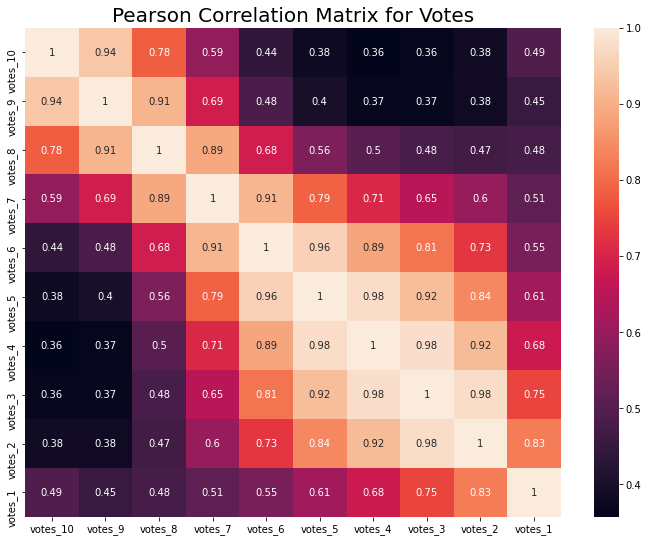

In [ ]:
total_votes = df.loc[:, df.columns.str.contains("votes_")]
corr = total_votes.corr()
plt.figure(figsize=(12, 9))
sns.heatmap(corr, annot=True)
plt.title("Pearson Correlation Matrix for Votes", fontsize=20)
plt.show()

In [ ]:
df_genres = df

genres=pd.DataFrame(index=[], columns=["name","count", "full_rating", "avg_rating"])

for index,movie in df_genres.iterrows():
    for genre in movie["genre"].split(", "):
        if(len(genres[genres["name"] == genre]) < 1):
            genres.loc[len(genres.index)] = [genre, 0,0,0]
        genres.loc[genres["name"] == genre, "count"] += 1
        genres.loc[genres["name"] == genre, "full_rating"] += movie["avg_vote"]

In [ ]:
for index,genre in genres.iterrows():
    if(genre["count"] != 0):
        genre["avg_rating"] = genre["full_rating"] / genre["count"]

genres

,name,count,full_rating,avg_rating
0,Romance,14128,86741.5,6.139687
1,Biography,2377,15745.3,6.624022
2,Crime,11067,66697.0,6.026656
3,Drama,47110,293772.1,6.235876
4,History,2296,15023.6,6.54338
5,Adventure,7590,44369.7,5.84581
6,Fantasy,3812,21898.6,5.744648
7,War,2242,14410.5,6.42752
8,Mystery,5225,30425.7,5.8231
9,Horror,9557,46192.3,4.833347


<AxesSubplot:xlabel='name', ylabel='avg_rating'>

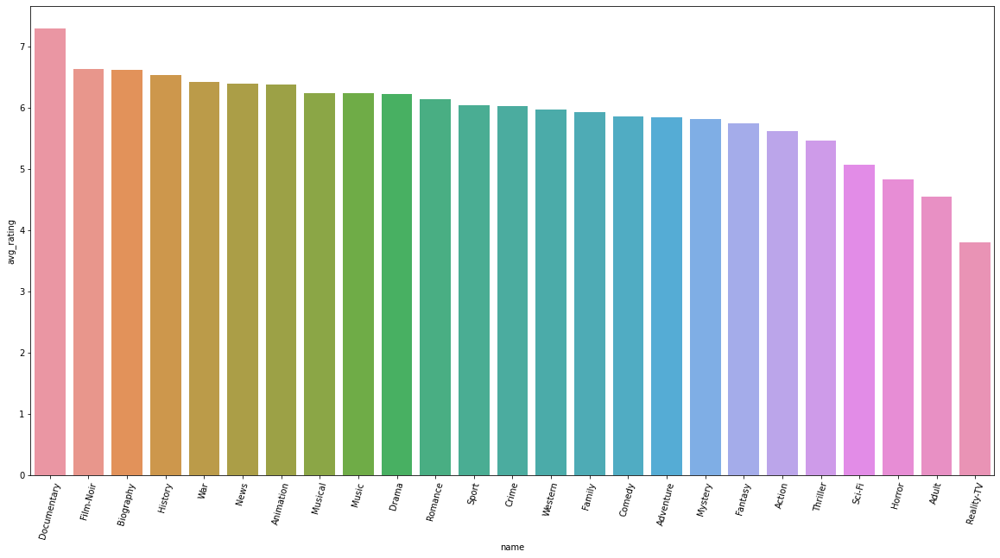

In [ ]:
plt.figure(figsize=(20,10))
plt.xticks(rotation=75)
sns.barplot(y="avg_rating",x="name", data=genres, order=genres.sort_values("avg_rating", ascending=False)["name"])

In [ ]:
title=movies_df['title']
worlwide_gross_income=movies_df['worlwide_gross_income']
year=movies_df['year']
top_money= pd.concat([title, worlwide_gross_income,year], axis='columns', sort=False)
top_money

,title,worlwide_gross_income,year
0,Miss Jerry,NaN,1894
1,The Story of the Kelly Gang,NaN,1906
2,Den sorte drøm,NaN,1911
3,Cleopatra,NaN,1912
4,L'Inferno,NaN,1911
...,...,...,...
85850,Le lion,$ 3507171,2020
85851,De Beentjes van Sint-Hildegard,$ 7299062,2020
85852,Padmavyuhathile Abhimanyu,NaN,2019
85853,Sokagin Çocuklari,$ 2833,2019


In [ ]:
movies_df['worlwide_gross_income']=movies_df['worlwide_gross_income'].replace('[$INRKGBP ]','', regex=True).astype(float)
movies_df['year']=movies_df['year'].replace('[TV Movie  ]','', regex=True).astype(int)

In [ ]:
top_money.sort_values(by= 'worlwide_gross_income', ascending = False, inplace = True)
toptop_money=top_money.head(25)
toptop_money

,title,worlwide_gross_income,year
75255,Wrong No.,PKR 157500000,2015
72026,Seto Surya,NPR 20000000,2016
71774,Thegidi,INR 76000000,2014
47207,Chandramukhi,INR 750000000,2005
74685,Temper,INR 740300000,2015
71792,Naan Sigappu Manithan,INR 740000000,2014
68188,Bhai,INR 69500000,2013
74418,Gopala Gopala,INR 660100000,2015
75406,Premam,INR 600000000,2015
76838,Naanum Rowdydhaan,INR 550000000,2015


In [ ]:
fig1=px.bar(toptop_money,x='title', y='worlwide_gross_income', text='year')
fig1.update_layout(title_text='Top 25 Money making Movies Worldwide', title_x=0.5, showlegend=True)
fig1.update_traces(texttemplate='%{text:.2s}', textposition='outside')
fig1.update_layout(uniformtext_minsize=8)
fig1.update_layout(xaxis_tickangle=-45)

In [ ]:
countries=pd.DataFrame(index=[], columns=["name","count", "full_rating", "avg_rating"])

for index,movie in movies_df.iterrows():
    for country in movie["country"].split(", "):
        if(len(countries[countries["name"] == country]) < 1):
            countries.loc[len(countries.index)] = [country, 0,0,0]
        countries.loc[countries["name"] == country, "count"] += 1
        countries.loc[countries["name"] == country, "full_rating"] += movie["avg_vote"]

In [ ]:
for index,country in countries.iterrows():
    if(country["count"] != 0):
        country["avg_rating"] = country["full_rating"] / country["count"]

countries

,name,count,full_rating,avg_rating
0,USA,23645,136988.8,5.793563
1,Australia,664,3918.3,5.901054
2,Germany,2020,12452.7,6.164703
3,Denmark,647,3866.8,5.976507
4,Italy,4016,24435.7,6.084587
...,...,...,...,...
162,Azerbaijan,1,8.6,8.6
163,Myanmar,1,5.9,5.9
164,Rwanda,1,6.7,6.7
165,Uganda,1,7.6,7.6


<AxesSubplot:xlabel='name', ylabel='avg_rating'>

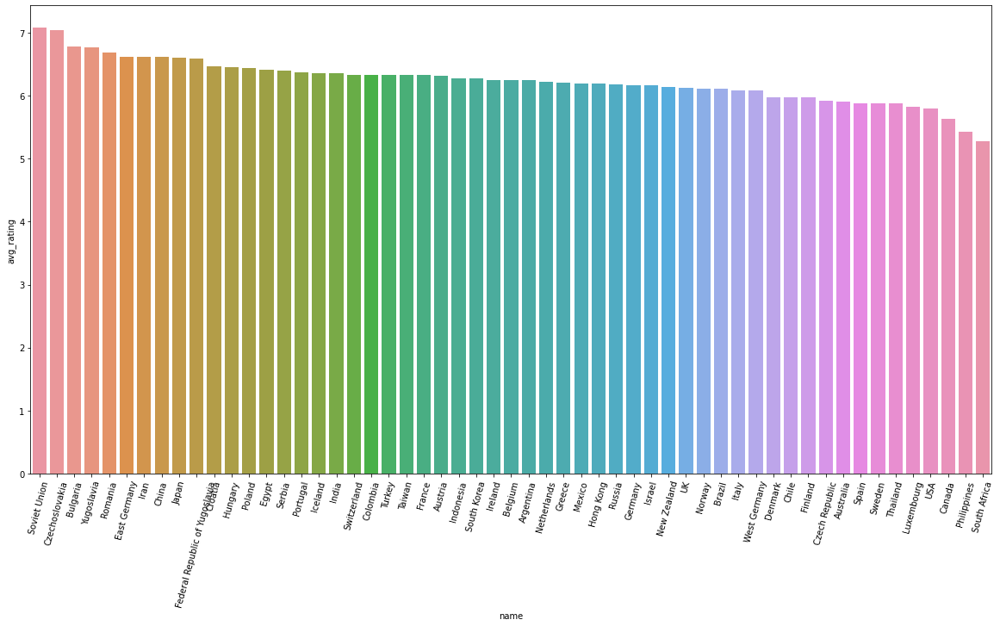

In [ ]:
plt.figure(figsize=(20,10))
plt.xticks(rotation=75)
sns.barplot(y="avg_rating",x="name", data=countries, order=countries[countries["count"] > 50].sort_values("avg_rating", ascending=False)["name"])

In [31]:
df

,title,original_title,year,date_published,genre,duration,country,language,director,writer,...,females_30age_avg_vote,females_30age_votes,females_45age_avg_vote,females_45age_votes,top1000_voters_rating,top1000_voters_votes,us_voters_rating,us_voters_votes,non_us_voters_rating,non_us_voters_votes
imdb_title_id,,,,,,,,,,,,,,,,,,,,,
tt0000009,Miss Jerry,Miss Jerry,1894,1894-10-09,Romance,45,USA,None,Alexander Black,Alexander Black,...,5.7,13.0,4.5,4.0,5.7,34.0,6.4,51.0,6.0,70.0
tt0000574,The Story of the Kelly Gang,The Story of the Kelly Gang,1906,1906-12-26,"Biography, Crime, Drama",70,Australia,None,Charles Tait,Charles Tait,...,6.2,23.0,6.6,14.0,6.4,66.0,6.0,96.0,6.2,331.0
tt0001892,Den sorte drøm,Den sorte drøm,1911,1911-08-19,Drama,53,"Germany, Denmark",NaN,Urban Gad,"Urban Gad, Gebhard Schätzler-Perasini",...,5.8,4.0,6.8,7.0,5.4,32.0,6.2,31.0,5.9,123.0
tt0002101,Cleopatra,Cleopatra,1912,1912-11-13,"Drama, History",100,USA,English,Charles L. Gaskill,Victorien Sardou,...,5.5,14.0,6.1,21.0,4.9,57.0,5.5,207.0,4.7,105.0
tt0002130,L'Inferno,L'Inferno,1911,1911-03-06,"Adventure, Drama, Fantasy",68,Italy,Italian,"Francesco Bertolini, Adolfo Padovan",Dante Alighieri,...,7.3,82.0,7.4,77.0,6.9,139.0,7.0,488.0,7.0,1166.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
tt9908390,Le lion,Le lion,2020,2020-01-29,Comedy,95,"France, Belgium",French,Ludovic Colbeau-Justin,"Alexandre Coquelle, Matthieu Le Naour",...,5.7,11.0,5.0,2.0,5.5,12.0,6.3,22.0,5.3,214.0
tt9911196,De Beentjes van Sint-Hildegard,De Beentjes van Sint-Hildegard,2020,2020-02-13,"Comedy, Drama",103,Netherlands,"German, Dutch",Johan Nijenhuis,"Radek Bajgar, Herman Finkers",...,8.0,47.0,7.3,30.0,7.0,6.0,6.8,13.0,7.7,388.0
tt9911774,Padmavyuhathile Abhimanyu,Padmavyuhathile Abhimanyu,2019,2019-03-08,Drama,130,India,Malayalam,Vineesh Aaradya,"Vineesh Aaradya, Vineesh Aaradya",...,NaN,NaN,NaN,NaN,1.0,1.0,NaN,NaN,2.0,2.0


In [32]:
import numpy as np

In [33]:
df.columns

Index(['title', 'original_title', 'year', 'date_published', 'genre',
       'duration', 'country', 'language', 'director', 'writer',
       'production_company', 'actors', 'description', 'avg_vote', 'votes',
       'weighted_average_vote', 'total_votes', 'mean_vote', 'median_vote',
       'votes_10', 'votes_9', 'votes_8', 'votes_7', 'votes_6', 'votes_5',
       'votes_4', 'votes_3', 'votes_2', 'votes_1', 'allgenders_18age_avg_vote',
       'allgenders_18age_votes', 'allgenders_30age_avg_vote',
       'allgenders_30age_votes', 'allgenders_45age_avg_vote',
       'allgenders_45age_votes', 'males_allages_avg_vote',
       'males_allages_votes', 'males_18age_avg_vote', 'males_18age_votes',
       'males_30age_avg_vote', 'males_30age_votes', 'males_45age_avg_vote',
       'males_45age_votes', 'females_allages_avg_vote',
       'females_allages_votes', 'females_18age_avg_vote',
       'females_18age_votes', 'females_30age_avg_vote', 'females_30age_votes',
       'females_45age_avg_vote', 'fe

In [34]:
df0 = df['weighted_average_vote']


In [35]:
#genres_unique = pd.DataFrame(df.genre.str.split('|').tolist()).stack().unique()
genres_unique = df['genre']
genres_unique = pd.DataFrame(genres_unique).drop_duplicates().values


In [53]:
df_xtest = df[['country', 'duration', 'avg_vote','genre','year']]
df_xtest2 = df_xtest.dropna()
df_xtest22 = df_xtest2[df_xtest2['duration'] <=80]


In [54]:
df_xtest22

,country,duration,avg_vote,genre,year
imdb_title_id,,,,,
tt0000009,USA,45,5.9,Romance,1894
tt0000574,Australia,70,6.1,"Biography, Crime, Drama",1906
tt0001892,"Germany, Denmark",53,5.8,Drama,1911
tt0002130,Italy,68,7.0,"Adventure, Drama, Fantasy",1911
tt0002199,USA,60,5.7,"Biography, Drama",1912
...,...,...,...,...,...
tt9863566,Belgium,72,5.4,"Animation, Comedy",2019
tt9866208,Canada,78,3.9,War,2019
tt9866344,Canada,72,5.4,"Comedy, Drama",2019


In [44]:
Family_mov = df_xtest22[ df_xtest22['genre']=='Family']
Crime_mov = df_xtest22[ df_xtest22['genre']=='Crime']

In [133]:
Drama_mov = df[df['genre']=='Drama']
Drama_mov

,title,original_title,year,date_published,genre,duration,country,language,director,writer,...,females_30age_avg_vote,females_30age_votes,females_45age_avg_vote,females_45age_votes,top1000_voters_rating,top1000_voters_votes,us_voters_rating,us_voters_votes,non_us_voters_rating,non_us_voters_votes
imdb_title_id,,,,,,,,,,,,,,,,,,,,,
tt0001892,Den sorte drøm,Den sorte drøm,1911,1911-08-19,Drama,53,"Germany, Denmark",NaN,Urban Gad,"Urban Gad, Gebhard Schätzler-Perasini",...,5.8,4.0,6.8,7.0,5.4,32.0,6.2,31.0,5.9,123.0
tt0002461,Richard III,Richard III,1912,1912-10-15,Drama,55,"France, USA",English,"André Calmettes, James Keane","James Keane, William Shakespeare",...,7.2,6.0,9.7,9.0,5.4,37.0,5.8,109.0,5.4,68.0
tt0002646,Atlantis,Atlantis,1913,1913-12-26,Drama,121,Denmark,Danish,August Blom,"Axel Garde, Gerhart Hauptmann",...,6.6,13.0,7.8,15.0,6.3,39.0,6.9,67.0,6.5,182.0
tt0003014,Il calvario di una madre,Ingeborg Holm,1913,1915-10-18,Drama,96,Sweden,NaN,Victor Sjöström,Nils Krok,...,7.2,44.0,8.0,41.0,6.8,83.0,7.1,212.0,7.0,519.0
tt0003102,Ma l'amor mio non muore...,Ma l'amor mio non muore...,1914,1914-01-01,Drama,90,Italy,Italian,Mario Caserini,"Emiliano Bonetti, G. Monleone",...,6.0,2.0,7.0,1.0,5.9,17.0,6.9,11.0,6.1,65.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
tt9892338,No Dorai,No Dorai,2019,2019-11-29,Drama,150,Bangladesh,Bengali,Taneem Rahman Angshu,"Mahboob Rahman, Shyamal Sengupta",...,NaN,NaN,9.0,1.0,NaN,NaN,7.6,36.0,7.1,60.0
tt9905412,Ottam,Ottam,2019,2019-03-08,Drama,120,India,Malayalam,Zam,Rajesh k Narayan,...,1.0,1.0,8.0,1.0,1.0,1.0,6.7,3.0,4.2,12.0
tt9905462,Pengalila,Pengalila,2019,2019-03-08,Drama,111,India,Malayalam,T.V. Chandran,T.V. Chandran,...,NaN,NaN,NaN,NaN,5.5,2.0,NaN,NaN,5.9,5.0


In [97]:
romance_mov = df[ df['genre']=='Romance']
romance_mov


,title,original_title,year,date_published,genre,duration,country,language,director,writer,...,females_30age_avg_vote,females_30age_votes,females_45age_avg_vote,females_45age_votes,top1000_voters_rating,top1000_voters_votes,us_voters_rating,us_voters_votes,non_us_voters_rating,non_us_voters_votes
imdb_title_id,,,,,,,,,,,,,,,,,,,,,
tt0000009,Miss Jerry,Miss Jerry,1894,1894-10-09,Romance,45,USA,None,Alexander Black,Alexander Black,...,5.7,13.0,4.5,4.0,5.7,34.0,6.4,51.0,6.0,70.0
tt0008930,Broadway Love,Broadway Love,1918,1918-01-21,Romance,60,USA,English,Ida May Park,"Ida May Park, W. Carey Wonderly",...,5.8,4.0,7.2,7.0,6.0,18.0,6.0,62.0,5.5,27.0
tt0011837,Das wandernde Bild,Das wandernde Bild,1920,1921-09-26,Romance,67,Germany,NaN,Fritz Lang,"Fritz Lang, Thea von Harbou",...,6.7,10.0,7.4,7.0,5.6,57.0,6.1,63.0,6.1,205.0
tt0012975,The Bride's Play,The Bride's Play,1922,1922-01-22,Romance,70,USA,English,George Terwilliger,"Mildred Considine, Brian Oswald Donn-Byrne",...,6.8,5.0,5.2,18.0,4.9,38.0,6.3,104.0,4.2,28.0
tt0015518,Yolanda,Yolanda,1924,1924-09-15,Romance,74,USA,English,Robert G. Vignola,"Charles Major, Luther Reed",...,9.0,1.0,7.5,4.0,3.8,13.0,5.7,23.0,2.6,13.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
tt9226154,Krymskiy most. Sdelano s lyubovyu!,Krymskiy most. Sdelano s lyubovyu!,2018,2018-11-01,Romance,102,Russia,Russian,Tigran Keosayan,Margarita Simonyan,...,1.1,22.0,1.0,4.0,1.2,5.0,2.6,24.0,1.1,405.0
tt9575164,From Miyamoto To You,From Miyamoto To You,2019,2019-09-27,Romance,129,Japan,Japanese,Tetsuya Mariko,"Hideki Arai, Tetsuya Mariko",...,6.2,6.0,NaN,NaN,2.5,2.0,7.3,8.0,7.6,69.0
tt9665402,Seetha,Seetha,2019,2019-05-24,Romance,161,India,"Telugu, Malayalam",Teja,"Gopalakrishna Paruchuri, Venkateswara Rao Paru...",...,4.8,4.0,1.0,1.0,3.4,5.0,4.4,30.0,4.6,128.0


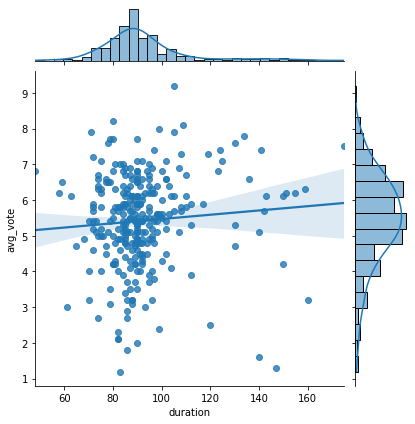

In [45]:
sns.jointplot( x='duration', y='avg_vote', data=Family_mov, kind='reg')


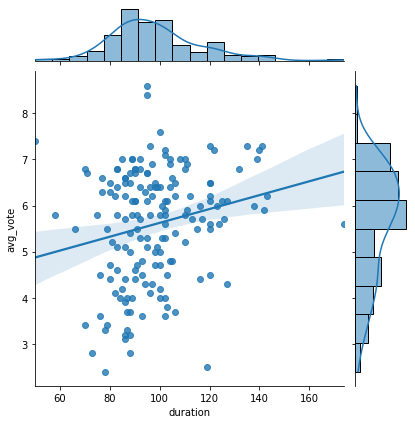

In [46]:
sns.jointplot( x='duration', y='avg_vote', data=Crime_mov, kind='reg')

# WordCloud for Genres.

In [57]:
from collections import Counter

genres=list(df['genre'])
gen=[]

for i in genres:
    i=list(i.split(','))
    for j in i:
        gen.append(j.replace(' ',""))
g=Counter(gen)

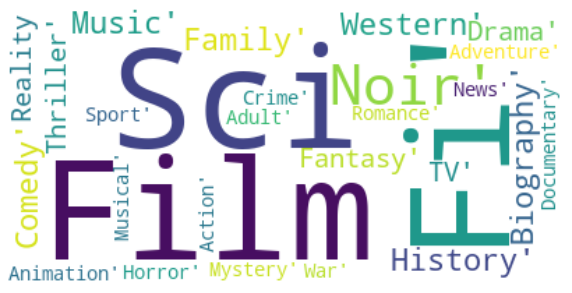

In [59]:
from wordcloud import WordCloud, STOPWORDS, ImageColorGenerator
from PIL import Image

text = list(set(gen))
plt.rcParams['figure.figsize'] = (10,10)

#assigning shape to the word cloud

wordcloud = WordCloud(max_words=1000000,background_color="white").generate(str(text))

plt.imshow(wordcloud,interpolation="bilinear")
plt.axis("off")
plt.show()

<AxesSubplot:xlabel='duration', ylabel='Density'>

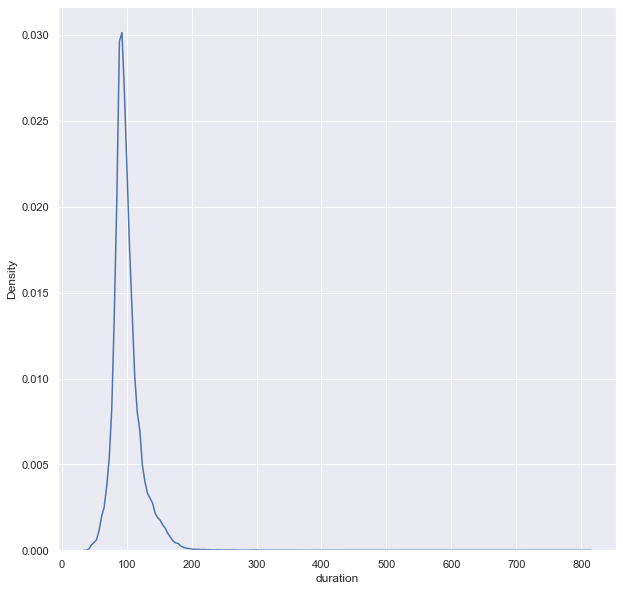

In [60]:
sns.set(style="darkgrid")
sns.kdeplot(data=df['duration'])

## The countries produced Romantic Movies

In [64]:
def get_country_code(country):
    country_codes = pd.read_csv('https://raw.githubusercontent.com/plotly/datasets/master/2014_world_gdp_with_codes.csv')
    if country == "South Korea":
        return "KOR"
    elif country == "Notrh Korea":
        return "PRK"
    elif country == "West Germany" or country == "East Germany":
        return "DEU"
    elif country == "Bahamas":
        return "BHM"
    elif country == "Soviet Union":
        return "RUS"
    else:
        try:
            return country_codes[country_codes["COUNTRY"] == country]["CODE"][0]
        except:
            return None

In [102]:
countries =list(romance_mov['country'])
country = []

for i in countries:
    i=list(i.split(','))
    for j in i:
        country.append(j.replace(' ',""))
country_count =Counter(country)

In [128]:
region={}
for val,count in country_count.items():
    code = get_country_code(val)
    if code !=None:
        region[val] = [count,code]
    else:
        region[val] = [count,val]

In [129]:
countries_dur = pd.DataFrame(region.values(), index= region.keys()).reset_index()
countries_dur.columns = ["country", "count", "code"]



In [130]:
countries_dur

,country,count,code
0,USA,59,USA
1,Germany,4,DEU
2,Finland,3,FIN
3,Yugoslavia,3,Yugoslavia
4,India,150,IND
5,SovietUnion,7,SovietUnion
6,WestGermany,1,WestGermany
7,Poland,5,POL
8,Italy,10,ITA
9,France,13,FRA


In [131]:
fig = px.choropleth(countries_dur, 
                    locations="code",
                    color="count",
                    hover_name="country",
                    color_continuous_scale=px.colors.sequential.Plasma)
fig.show()

## The countries produced Drama Movies

In [143]:
Drama_mov

,title,original_title,year,date_published,genre,duration,country,language,director,writer,...,females_30age_avg_vote,females_30age_votes,females_45age_avg_vote,females_45age_votes,top1000_voters_rating,top1000_voters_votes,us_voters_rating,us_voters_votes,non_us_voters_rating,non_us_voters_votes
imdb_title_id,,,,,,,,,,,,,,,,,,,,,
tt0001892,Den sorte drøm,Den sorte drøm,1911,1911-08-19,Drama,53,"Germany, Denmark",NaN,Urban Gad,"Urban Gad, Gebhard Schätzler-Perasini",...,5.8,4.0,6.8,7.0,5.4,32.0,6.2,31.0,5.9,123.0
tt0002461,Richard III,Richard III,1912,1912-10-15,Drama,55,"France, USA",English,"André Calmettes, James Keane","James Keane, William Shakespeare",...,7.2,6.0,9.7,9.0,5.4,37.0,5.8,109.0,5.4,68.0
tt0002646,Atlantis,Atlantis,1913,1913-12-26,Drama,121,Denmark,Danish,August Blom,"Axel Garde, Gerhart Hauptmann",...,6.6,13.0,7.8,15.0,6.3,39.0,6.9,67.0,6.5,182.0
tt0003014,Il calvario di una madre,Ingeborg Holm,1913,1915-10-18,Drama,96,Sweden,NaN,Victor Sjöström,Nils Krok,...,7.2,44.0,8.0,41.0,6.8,83.0,7.1,212.0,7.0,519.0
tt0003102,Ma l'amor mio non muore...,Ma l'amor mio non muore...,1914,1914-01-01,Drama,90,Italy,Italian,Mario Caserini,"Emiliano Bonetti, G. Monleone",...,6.0,2.0,7.0,1.0,5.9,17.0,6.9,11.0,6.1,65.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
tt9892338,No Dorai,No Dorai,2019,2019-11-29,Drama,150,Bangladesh,Bengali,Taneem Rahman Angshu,"Mahboob Rahman, Shyamal Sengupta",...,NaN,NaN,9.0,1.0,NaN,NaN,7.6,36.0,7.1,60.0
tt9905412,Ottam,Ottam,2019,2019-03-08,Drama,120,India,Malayalam,Zam,Rajesh k Narayan,...,1.0,1.0,8.0,1.0,1.0,1.0,6.7,3.0,4.2,12.0
tt9905462,Pengalila,Pengalila,2019,2019-03-08,Drama,111,India,Malayalam,T.V. Chandran,T.V. Chandran,...,NaN,NaN,NaN,NaN,5.5,2.0,NaN,NaN,5.9,5.0


In [145]:
countries =list(Drama_mov['country'])
country = []

for i in countries:
    try:
        i=list(i.split(','))
    except:
        continue
    for j in i:
        country.append(j.replace(' ',""))
country_count =Counter(country)

In [146]:
region={}
for val,count in country_count.items():
    code = get_country_code(val)
    if code !=None:
        region[val] = [count,code]
    else:
        region[val] = [count,val]

In [147]:
countries_dur = pd.DataFrame(region.values(), index= region.keys()).reset_index()
countries_dur.columns = ["country", "count", "code"]


In [148]:
fig = px.choropleth(countries_dur, 
                    locations="code",
                    color="count",
                    hover_name="country",
                    color_continuous_scale=px.colors.sequential.Plasma)
fig.show()